## Calibration executer

Auteurs : Léa Drolet-Roy

Création : 2025-04-04

Dernière modification : 2025-04-27

In [1]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pickle
import toml
import json
import glob
import shutil
from pathlib import Path

from scipy.optimize import minimize

from caleabration.calibration import Calibration
from caleabration.charuco import Charucoboard

np.set_printoptions(precision=4, suppress=True)

## Initial parameters

In [5]:
""" # Paramètres Spot
CHECKERBOARD = (9,4)
square_size = 112
marker_size = 86
legacy = True """

""" # Paramètres grand simul
CHECKERBOARD = (5,4)
square_size = 230
marker_size = 172
legacy = True """

# Paramètres petit simul
CHECKERBOARD = (4,5)
square_size = 150
marker_size = 112
legacy = False

image_size = (1920, 1080)

aruco_name = cv2.aruco.DICT_4X4_50

# create Charurco board object
Board = Charucoboard(CHECKERBOARD, square_size, marker_size, aruco_name, legacy)

# validate board creation
Board.create_and_save_new_board()

# create Calibration object
Calib = Calibration(Board, image_size)

cams = ['M11139', 'M11140', 'M11141', 'M11458', 'M11459', 'M11461', 'M11462', 'M11463']

time_threshold = 15

path = r'C:\Users\Lea\Documents\OptiTrack\Default\20250429\calib\calib_ext'
path_world = r'C:\Users\Lea\Documents\OptiTrack\Default\20250429\calib\world'
calib_dir = os.path.join(path, 'corners_found')

### Script for folder reassembly

In [7]:
directory = path

for dir in os.listdir(directory):
    if str(dir).split('-') in cams:
        pass

main_dir = Path(directory)
output_dir = main_dir / 'images'

output_dir.mkdir(exist_ok=True)

for subdir in main_dir.iterdir():
    if subdir.is_dir():
        suffix = subdir.name.split('-')[-1]
        target_dir = output_dir / suffix
        target_dir.mkdir(exist_ok=True)

        for file in subdir.glob('*'):
            if file.is_file():
                shutil.copy(file, target_dir / file.name)

print('Files grouped succesfully!')

Files grouped succesfully!


### Test board detection

Aucun coin détecté.


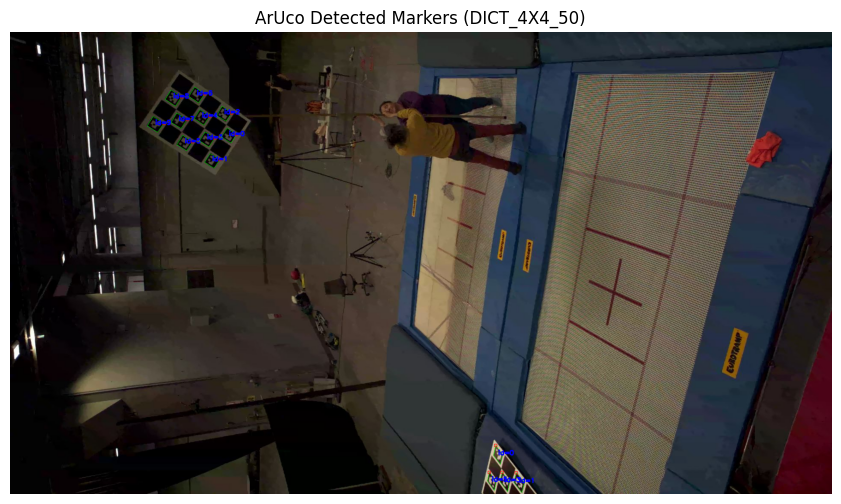

In [14]:
import cv2
import cv2.aruco as aruco
import matplotlib.pyplot as plt

# Chargement de l'image
image = cv2.imread(r"C:\Users\Lea\Documents\OptiTrack\Default\extrinsics\intrinsics\M11458\extrinsic2_002-camera004_frame00056.jpg")
gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

# Choix du dictionnaire (commence par 4x4_50)
aruco_dict = aruco.getPredefinedDictionary(aruco.DICT_4X4_50)
board = cv2.aruco.CharucoBoard(CHECKERBOARD, square_size, marker_size, aruco_dict)
board.setLegacyPattern(legacy)
parameters = aruco.DetectorParameters()

""" # Détection des marqueurs (v 4.7)
markerCorners, markerIds, reject  = cv2.aruco.detectMarkers(gray, aruco_dict)
retval, charucoCorners, charucoIds = cv2.aruco.interpolateCornersCharuco(markerCorners, markerIds, gray, board)
"""
# Détection des marqueurs (v 4.11)
charuco_detector = cv2.aruco.CharucoDetector(board)
charucoCorners, charucoIds, markerCorners, markerIds = charuco_detector.detectBoard(image)

img_with_charuco_corners = image.copy()
img_with_charuco_corners = cv2.aruco.drawDetectedMarkers(img_with_charuco_corners, markerCorners, markerIds)

# Impression des IDs détectés
if charucoIds is not None:
    print("IDs détectés :", charucoIds.flatten())
    img_with_charuco_corners = cv2.aruco.drawDetectedCornersCharuco(img_with_charuco_corners, charucoCorners, charucoIds)
else:
    print("Aucun coin détecté.")
                         
# Affichage avec matplotlib
plt.figure(figsize=(12, 6))
plt.imshow(cv2.cvtColor(img_with_charuco_corners, cv2.COLOR_BGR2RGB))
plt.title("ArUco Detected Markers (DICT_4X4_50)")
plt.axis("off")
plt.show()

### Save images with detections

Images saving...
Coverage for cam M11139: 18.23%
Coverage for cam M11140: 6.01%
Coverage for cam M11141: 26.61%
Coverage for cam M11458: 11.07%
Coverage for cam M11459: 22.23%
Coverage for cam M11461: 23.14%
Coverage for cam M11462: 27.45%
Coverage for cam M11463: 29.40%
Saved 1314 valid frames.


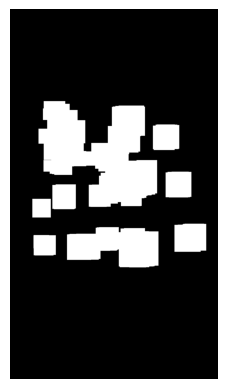

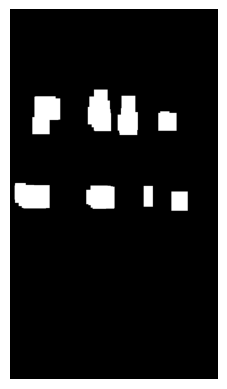

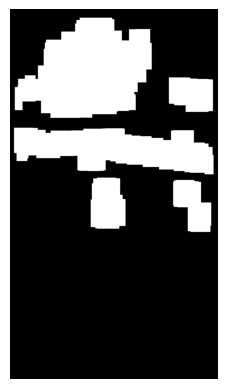

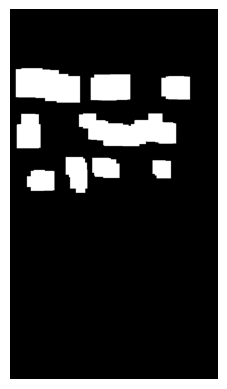

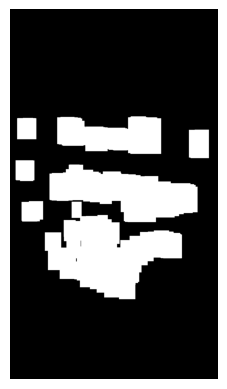

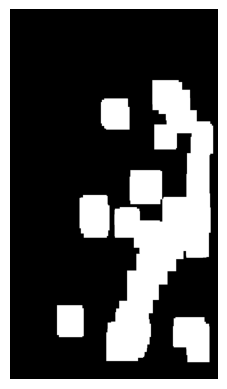

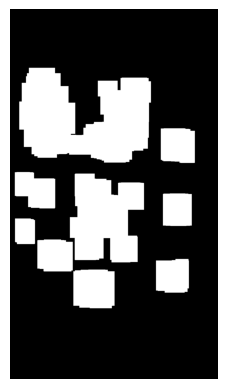

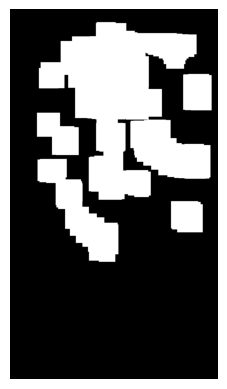

In [22]:
valid_frame_count, total_area_covered, mask_covered = Calib.saveImagesBoard(path, 'jpg', save_corners=True, dirname='images', skip=10)

for mask in mask_covered:
    plt.imshow(mask, cmap='gray')
    plt.axis('off') 
    plt.show()
    plt.close()

### Intrinsic calibration

In [5]:
# Try setting an initial camera matrix
w,h = image_size
focal_length = 1200 # Approximate focal length
camera_matrix_init = np.array([
    [focal_length, 0, w / 2],
    [0, focal_length, h / 2],
    [0, 0, 1]], dtype=np.float32)

cams = ['M11139', 'M11140', 'M11141', 'M11458', 'M11459', 'M11461', 'M11462', 'M11463']
ret, C, S, D, K = Board.calibrate_intrinsics(calib_dir, cams, image_size, camera_matrix_init)

K = np.array(K)
np.savez('Intrinsics_K_conf.npz', K)

D = np.array(D)
np.savez('Intrinsics_D_conf.npz', D)


Nombre d'images retenues : 135
Calibration completed for camera: M11139
Error: 0.2443
Camera Matrix:
 [[1264.3199    0.      958.8236]
 [   0.     1263.97    526.6301]
 [   0.        0.        1.    ]]
Distortion Coefficients:
 [[-0.1612  0.3483 -0.0001  0.0016 -0.2586]]

Nombre d'images retenues : 65
Calibration completed for camera: M11140
Error: 0.2051
Camera Matrix:
 [[1271.0239    0.      947.2314]
 [   0.     1274.527   507.6766]
 [   0.        0.        1.    ]]
Distortion Coefficients:
 [[-0.2121  0.4888 -0.0068 -0.0037 -0.4999]]

Nombre d'images retenues : 158
Calibration completed for camera: M11141
Error: 0.2848
Camera Matrix:
 [[2187.4013    0.      994.366 ]
 [   0.     2197.068   553.4328]
 [   0.        0.        1.    ]]
Distortion Coefficients:
 [[ 0.074  -0.5568 -0.0008  0.0073  2.5454]]

Nombre d'images retenues : 62
Calibration completed for camera: M11458
Error: 0.1884
Camera Matrix:
 [[1304.5228    0.      962.9241]
 [   0.     1293.7519  530.1762]
 [   0.       

### Transfo to global reference frame

In [23]:
# Transfo to global reference frame
K_conf = np.load('calib_0425/Intrinsics_K_conf.npz')['arr_0']
D_conf = np.load('calib_0425/Intrinsics_D_conf.npz')['arr_0']

# create Charurco board object
big_Board = Charucoboard(checkerboard=(5,4), square_size=230, marker_size=172, aruco_name=aruco_name, legacy=True)
big_board = big_Board.charuco_board
# create Calibration object
big_Calib = Calibration(big_Board, image_size)

# save images
valid_frame_count, total_area_covered, mask_covered = big_Calib.saveImagesBoard(path_world, 'jpg', dirname='images', save_corners=True, skip=1)

# save stereo data
big_Calib.saveImagePoints(path_world, cams, savename='data_world')

with open('data_world.pkl', 'rb') as f:
    images_world = pickle.load(f)

list_charcuoTcam = []
for cam in cams:
    Params = {}
    camMatrix = K_conf[cams.index(cam)]
    distCoeffs = D_conf[cams.index(cam)]

    corners = [images_world['Charuco_Corners'][i] for i in range(0, len(images_world['Charuco_Corners'])) if images_world['Camera'][i] == cam]
    ids = [images_world['Charuco_Ids'][i] for i in range(0, len(images_world['Charuco_Corners'])) if images_world['Camera'][i] == cam]
    
    corners = [i for sublist in corners for i in sublist]
    ids = [i for sublist in ids for i in sublist]

    if len(corners) >= 2:
        charucoCorners = np.array(corners, dtype=np.float32)
        charucoIds = np.array(ids, dtype=np.int32)

        if camMatrix.size != 0 and distCoeffs.size != 0: # and len(charucoIds) >= 4:
            objPoints, imgPoints = big_board.matchImagePoints(charucoCorners, charucoIds)
            success, rvec, tvec = cv2.solvePnP(objPoints, imgPoints, camMatrix, distCoeffs)

            R, _ = cv2.Rodrigues(rvec)
            t = tvec.reshape(3,1)
            camTcharuco = np.vstack([np.hstack([R,t]), np.array([0,0,0,1])])
            charucoTcam = np.linalg.inv(camTcharuco)
            print(charucoTcam)
            list_charcuoTcam.append(charucoTcam)

            # Project the 3D object points to 2D using the estimated pose
            projectedPoints, _ = cv2.projectPoints(objPoints, rvec, tvec, camMatrix, distCoeffs)

            # Compute reprojection error (Euclidean distance between observed and projected points)
            errors = np.linalg.norm(imgPoints - projectedPoints.squeeze(), axis=1)
            mean_error = np.mean(errors)
            print(cam, 'RMSE =', mean_error, 'pixels  dist =', np.linalg.norm(tvec)/1000, 'm')


Images saving...
Coverage for cam M11139: 0.89%
Coverage for cam M11140: 0.35%
Coverage for cam M11141: 0.00%
Coverage for cam M11458: 0.26%
Coverage for cam M11459: 0.66%
Coverage for cam M11461: 0.00%
Coverage for cam M11462: 0.00%
Coverage for cam M11463: 0.00%
Saved 66 valid frames.
[[   -0.1767     0.6423    -0.7458  4518.4339]
 [   -0.011     -0.759     -0.651   3728.3825]
 [   -0.9842    -0.1068     0.1412 -3382.9559]
 [    0.         0.         0.         1.    ]]
M11139 RMSE = 828.20935 pixels  dist = 6.764722562053943 m
[[   -0.039     -0.9592    -0.2801  1661.8166]
 [    0.0479    -0.2818     0.9583 -6555.8841]
 [   -0.9981     0.0239     0.057  -3909.989 ]
 [    0.         0.         0.         1.    ]]
M11140 RMSE = 479.61404 pixels  dist = 7.81212290971305 m
[[   -0.0915     0.9554     0.2807 -1591.6007]
 [   -0.427     -0.2923     0.8557 -6395.409 ]
 [    0.8996    -0.0415     0.4347 -3873.4866]
 [    0.         0.         0.         1.    ]]
M11458 RMSE = 288.55823 pixe

In [24]:
world_t_charuco = np.array([0, 0, 1200]).reshape((3,1))
world_R_charuco = np.array([[1,0,0],
                            [0,-1,0],
                            [0,0,-1]])
#print(np.linalg.det(world_R_charuco))
worldTcharuco = np.vstack([np.hstack([world_R_charuco, world_t_charuco]), np.array([0,0,0,1])])
#print(worldTcharuco)

list_worldTcam = []
for camTcharuco in list_charcuoTcam:
    worldTcam = worldTcharuco @ camTcharuco
    list_worldTcam.append(worldTcam)

np.savez('WorldTcam_charuco.npz', list_worldTcam)

### Save stereo data

In [25]:
Calib.saveStereoData(path, cams)

M11139 M11140 0
M11139 M11141 100
M11139 M11458 0
M11139 M11459 17
M11139 M11461 76
M11139 M11462 100
M11139 M11463 0
M11140 M11141 0
M11140 M11458 35
M11140 M11459 0
M11140 M11461 0
M11140 M11462 0
M11140 M11463 11
M11141 M11458 0
M11141 M11459 100
M11141 M11461 84
M11141 M11462 100
M11141 M11463 10
M11458 M11459 0
M11458 M11461 0
M11458 M11462 0
M11458 M11463 43
M11459 M11461 57
M11459 M11462 16
M11459 M11463 94
M11461 M11462 78
M11461 M11463 1
M11462 M11463 0


In [26]:
# K_conf = np.load('Intrinsics_K_conf.npz')['arr_0']
# D_conf = np.load('Intrinsics_D_conf.npz')['arr_0']

with open('stereo_data.pkl', 'rb') as f:
    stereo_images = pickle.load(f)

In [27]:
for camL in cams:
    Left_Params = {}
    Left_Params['Intrinsic'] = K_conf[cams.index(camL)]
    Left_Params['Distortion'] = D_conf[cams.index(camL)]

    for camR in cams[cams.index(camL)+1:]:
        Right_Params = {}
        print(camL, camR)

        Left_corners = [stereo_images['Charuco_Corners'][i] for i in range(0, len(stereo_images['Corners']), 2) if stereo_images['Camera'][i] == camL and stereo_images['Camera'][i+1] == camR]
        Right_corners = [stereo_images['Charuco_Corners'][i] for i in range(1, len(stereo_images['Corners']), 2) if stereo_images['Camera'][i-1] == camL and stereo_images['Camera'][i] == camR]
        
        Left_ids = [stereo_images['Charuco_Ids'][i] for i in range(0, len(stereo_images['Corners']), 2) if stereo_images['Camera'][i] == camL and stereo_images['Camera'][i+1] == camR]
        Right_ids = [stereo_images['Charuco_Ids'][i] for i in range(1, len(stereo_images['Corners']), 2) if stereo_images['Camera'][i-1] == camL and stereo_images['Camera'][i] == camR]
        
        if len(Left_corners) >= 5 and len(Right_corners) >= 5:

            Right_Params['Intrinsic'] = K_conf[cams.index(camR)]
            Right_Params['Distortion'] = D_conf[cams.index(camR)]
            
            ret, Stereo_Params, K1, D1, K2, D2 = Calib.StereoCalibration(Right_Params, Left_Params, Right_corners, Right_ids, Left_corners, Left_ids,)

            if ret:
                print('Transformation Matrix:')
                print(Stereo_Params['Transformation'])
                print(Stereo_Params['MeanError'])
                print(Stereo_Params['Nobj'], '\n')

                Calib.SaveParameters(camL, camR, Stereo_Params, Left_Params, Right_Params)
            else:
                print('Not enough corners', '\n')
        else:
            print('Not enough images', '\n')

M11139 M11140
Not enough images 

M11139 M11141
Transformation Matrix:
[[    0.9386    -0.1866     0.2902 -1460.2304]
 [   -0.0991     0.6598     0.7448 -6434.0746]
 [   -0.3305    -0.7279     0.6008   600.2863]
 [    0.         0.         0.         1.    ]]
0.19698022468238474
1089 

M11139 M11458
Not enough images 

M11139 M11459
Transformation Matrix:
[[   -0.9295     0.2427    -0.2778  1525.6016]
 [   -0.266      0.081      0.9606 -5580.0645]
 [    0.2557     0.9667    -0.0108  6402.3036]
 [    0.         0.         0.         1.    ]]
0.4069654725206325
147 

M11139 M11461
Transformation Matrix:
[[   -0.0774    -0.6922     0.7175 -3841.4947]
 [    0.8738     0.2994     0.3832 -3515.3316]
 [   -0.4801     0.6566     0.5817  1436.3404]
 [    0.         0.         0.         1.    ]]
0.24502028817829613
791 

M11139 M11462
Transformation Matrix:
[[    0.951     -0.1479     0.2714 -2235.4807]
 [    0.1889     0.9731    -0.1317  1274.1835]
 [   -0.2447     0.1765     0.9534 -1804.9522

In [28]:
def mean_transfo(T1, T2):
    r1, _ = cv2.Rodrigues(T1[0:3,0:3])
    r2, _ = cv2.Rodrigues(T2[0:3,0:3])
    r = np.mean([r1, r2], axis=0)
    R, _ = cv2.Rodrigues(r)

    t = np.mean([T1[0:3, 3], T2[0:3,3]], axis=0).reshape((3,1))
    Tmean = np.vstack((np.hstack((R, t)), np.array([0,0,0,1])))

    return Tmean

c1_c3 = np.load('M11139_M11141_parameters.npz')['Transformation']
#c1_c5 = np.load('M11139_M11459_parameters.npz')['Transformation']
c1_c6 = np.load('M11139_M11461_parameters.npz')['Transformation']
c1_c7 = np.load('M11139_M11462_parameters.npz')['Transformation']

c2_c4 = np.load('M11140_M11458_parameters.npz')['Transformation']
#c2_c7 = np.load('M11140_M11462_parameters.npz')['Transformation']
#c2_c8 = np.load('M11140_M11463_parameters.npz')['Transformation']

c3_c5 = np.load('M11141_M11459_parameters.npz')['Transformation']
c3_c6 = np.load('M11141_M11461_parameters.npz')['Transformation']
c3_c7 = np.load('M11141_M11462_parameters.npz')['Transformation']
c3_c8 = np.load('M11141_M11463_parameters.npz')['Transformation']

#c4_c7 = np.load('M11458_M11462_parameters.npz')['Transformation']
c4_c8 = np.load('M11458_M11463_parameters.npz')['Transformation']

c5_c6 = np.load('M11459_M11461_parameters.npz')['Transformation']
c5_c8 = np.load('M11459_M11463_parameters.npz')['Transformation']
#c6_c7 = np.load('M11461_M11462_parameters.npz')['Transformation']

Tcam1 = np.eye((4))
Tcam3 = c1_c3
Tcam6 = c1_c6
Tcam7 = c1_c7

Tcam5 = c1_c6 @ np.linalg.inv(c5_c6)

Tcam8_1 = Tcam3 @ c3_c8
Tcam8_2 = Tcam5 @ c5_c8

Tcam8 = mean_transfo(Tcam8_1, Tcam8_2)

# Tcam4_1 = Tcam8 @ np.linalg.inv(c4_c8)
# Tcam4_2 = Tcam2 @ c2_c4
# Tcam4 = mean_transfo(Tcam4_1, Tcam4_2)

Tcam4 = Tcam8 @ np.linalg.inv(c4_c8)
Tcam2 = Tcam4 @ np.linalg.inv(c2_c4)

projMat = [Tcam1, Tcam2, Tcam3, Tcam4, Tcam5, Tcam6, Tcam7, Tcam8]

worldTcam1 = np.array(np.load('WorldTCam_charuco.npz')['arr_0'][0])
projMatWorld = []
for mat in projMat:
    projMatWorld.append(worldTcam1 @ mat)

np.savez('projMatWorld.npz', projMatWorld)

## Optimization of extrinsics parameters

In [29]:
num_cameras = 8
num_params_per_cam = 6

init_params = []
for mat_inv in projMatWorld:
    mat = np.linalg.inv(mat_inv)
    rvec, _ = cv2.Rodrigues(mat[0:3,0:3])
    rvec = rvec.squeeze()
    params = [rvec[0], rvec[1], rvec[2], mat[0,3], mat[1,3], mat[2,3]]
    init_params.extend(params)

init_params = np.array(init_params, dtype=np.float64)


board = Board.type
K = K_conf
D = D_conf

def fun(params):
    error = 0
    params = np.array(params)

    projMat = np.empty((num_cameras, 3, 4))

    for cam_idx in range(num_cameras):
        cam_params = params[cam_idx * num_params_per_cam : (cam_idx + 1) * num_params_per_cam]
        r1, r2, r3, t1, t2, t3 = cam_params
        rvec = np.array([r1, r2, r3])
        R, _ = cv2.Rodrigues(rvec)
        t = np.array([t1, t2, t3]).reshape((3,1))
        projMat[cam_idx] = np.hstack((R, t))

    RMSE = {c:[] for c in range(8)}
    # Loop on stereo images checkerboard points
    for i in range(0, len(stereo_images['Camera']) - 1, 2):
        j = i+1 # stereo image is the next one

        pts1_im = stereo_images['Charuco_Corners'][i].squeeze()
        pts2_im = stereo_images['Charuco_Corners'][j].squeeze()

        c1 = cams.index(stereo_images['Camera'][i])
        c2 = cams.index(stereo_images['Camera'][j])

        undist_pts1 = cv2.undistortPoints(pts1_im.reshape(-1,1,2), K[c1], D[c1]).reshape(-1, 2)  # Shape (2, N)
        undist_pts2 = cv2.undistortPoints(pts2_im.reshape(-1,1,2), K[c2], D[c2]).reshape(-1, 2)  # Shape (2, N)

        if board == 'charuco':
            Lids = stereo_images['Charuco_Ids'][i].squeeze()
            Rids = stereo_images['Charuco_Ids'][j].squeeze()

            obj_pts, img_pts_l, img_pts_r, common_ids = Board.getObjectImagePoints(undist_pts1, Lids, undist_pts2, Rids)
            img_pts_l, img_pts_r = img_pts_l.squeeze(), img_pts_r.squeeze()

            ids_to_keepL = [list(Lids).index(t) for t in common_ids]
            ids_to_keepR = [list(Rids).index(t) for t in common_ids]
            pts1_im, pts2_im = pts1_im[ids_to_keepL], pts2_im[ids_to_keepR]

        elif board == 'checker':
            img_pts_l, img_pts_r = undist_pts1, undist_pts2

        # Perform triangulation
        pts_4d = cv2.triangulatePoints(projMat[c1], projMat[c2], img_pts_l.T, img_pts_r.T)
        points_3d = pts_4d[:3, :] / pts_4d[3, :]  # Shape (3, N)
        points_3d = points_3d.T  # Shape (N, 3)

        # Compute RMSE for both cameras
        rmse1 = Calib.compute_rmse(pts1_im, points_3d, projMat[c1], K[c1], D[c1])
        rmse2 = Calib.compute_rmse(pts2_im, points_3d, projMat[c2], K[c2], D[c2])

        RMSE[c1].append(rmse1)
        RMSE[c2].append(rmse2)

    # Per-camera mean RMSE
    rmse_mean = []
    for _, rmse in RMSE.items():
        rmse_mean.append(np.mean(rmse))

    error = np.mean(rmse_mean) + 0.1 * np.max(rmse_mean)   # OPTIONAL: add max error to cost function
    
    return error

In [30]:
res = minimize(fun=fun, x0=init_params, method='trust-constr', options={'gtol':1e-6, 'xtol':1e-6, 'maxiter':200, 'verbose':3})

best_error, best_params = res.fun, res.x
optimized_params = best_params

print(f"Best Reprojection Error: {best_error:.4f} pixels")

# Extract optimized parameters for each camera
optimized_params = np.split(best_params, num_cameras)

extrinsics = []
WorldTCam_opt = []

for cam_idx in range(num_cameras):
    r1, r2, r3, t1, t2, t3 = optimized_params[cam_idx]
    rvec = np.array([r1,r2,r3], dtype=np.float64)
    R, _ = cv2.Rodrigues(rvec)
    t = np.array([t1,t2,t3], dtype=np.float64).reshape((3,1))

    optimized_camera_matrix = np.hstack((R,t))
    extrinsics.append(optimized_camera_matrix)
    WorldTCam_opt.append(np.linalg.inv(np.vstack((optimized_camera_matrix, np.array([0,0,0,1])))))

np.savez('Extrinsics_optimized.npz', extrinsics)
np.savez('WorldTCam_opt.npz', WorldTCam_opt)

| niter |f evals|CG iter|  obj func   |tr radius |   opt    |  c viol  | penalty  |CG stop|
|-------|-------|-------|-------------|----------|----------|----------|----------|-------|
|   1   |  49   |   0   | +4.1712e-01 | 1.00e+00 | 3.40e+01 | 0.00e+00 | 1.00e+00 |   0   |


c:\Users\Lea\Documents\Trampo\code\.venv\Lib\site-packages\scipy\optimize\_hessian_update_strategy.py:160: RuntimeWarning: invalid value encountered in scalar divide
  return y_norm2 / ys


|   2   |  98   |   1   | +4.1712e-01 | 1.00e-01 | 3.40e+01 | 0.00e+00 | 1.00e+00 |   2   |
|   3   |  147  |  49   | +4.1712e-01 | 1.00e-01 | 3.40e+01 | 0.00e+00 | 1.00e+00 |   1   |
|   4   |  147  |  97   | +4.1712e-01 | 1.00e-01 | 3.40e+01 | 0.00e+00 | 1.00e+00 |   1   |
|   5   |  147  |  145  | +4.1712e-01 | 1.00e-01 | 3.40e+01 | 0.00e+00 | 1.00e+00 |   1   |
|   6   |  147  |  193  | +4.1712e-01 | 1.00e-01 | 3.40e+01 | 0.00e+00 | 1.00e+00 |   1   |
|   7   |  147  |  241  | +4.1712e-01 | 1.00e-01 | 3.40e+01 | 0.00e+00 | 1.00e+00 |   1   |
|   8   |  147  |  289  | +4.1712e-01 | 1.00e-01 | 3.40e+01 | 0.00e+00 | 1.00e+00 |   1   |
|   9   |  147  |  337  | +4.1712e-01 | 1.00e-01 | 3.40e+01 | 0.00e+00 | 1.00e+00 |   1   |
|  10   |  147  |  385  | +4.1712e-01 | 1.00e-01 | 3.40e+01 | 0.00e+00 | 1.00e+00 |   1   |
|  11   |  147  |  433  | +4.1712e-01 | 1.00e-01 | 3.40e+01 | 0.00e+00 | 1.00e+00 |   1   |
|  12   |  147  |  481  | +4.1712e-01 | 1.00e-01 | 3.40e+01 | 0.00e+00 | 1.00e+0

### Plot Cameras in World frame

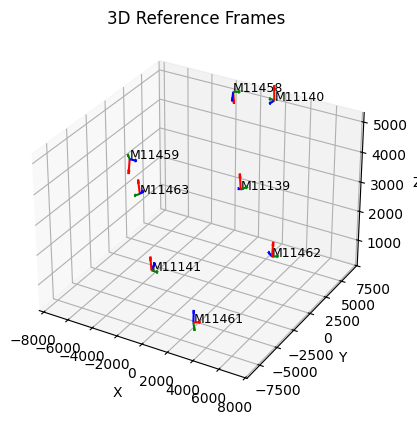

In [19]:
from plotCams3D import plot_frame

# Plot frames
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

for i, T in enumerate(WorldTCam_opt):
    T = np.vstack((T, np.array([0,0,0,1])))
    plot_frame(ax, T, label=cams[i])

# Labels
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")
plt.title("3D Reference Frames")
plt.show()
plt.close()

## 2D visualization of original and projected points onto images

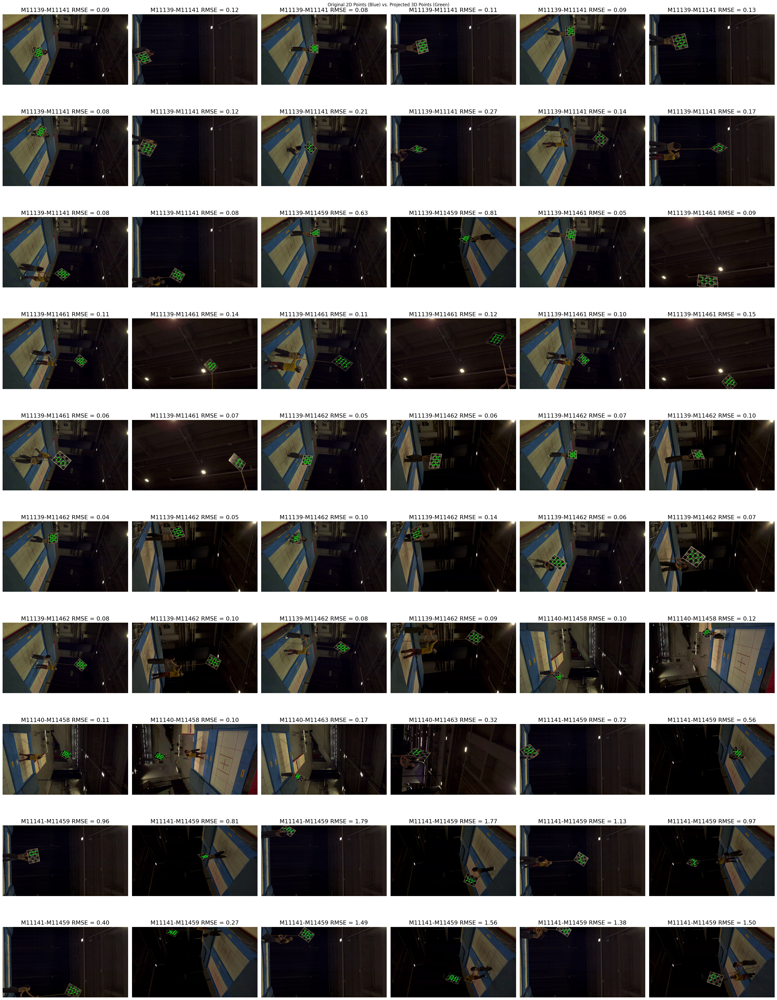

M11139-M11141 0.10176117
M11139-M11459 0.5302016
M11139-M11461 0.12981653
M11139-M11462 0.08297131
M11140-M11458 0.110340565
M11140-M11463 0.32266614
M11141-M11459 0.9281926
M11141-M11461 0.93328124
M11141-M11462 0.29653922
M11141-M11463 0.5704738
M11458-M11463 0.12620346
M11459-M11461 0.14566007
M11459-M11462 1.1132059
M11459-M11463 0.6577682
M11461-M11462 0.35601923
M11461-M11463 1.3931451
RMSE total -- Mean: 0.487390398979187, Median: 0.3393426835536957


In [31]:
def draw_circles(img, pts_2d_original, pts_2d_projected, text=True):

    pts_2d_original = pts_2d_original.reshape(-1,2)
    pts_2d_projected = pts_2d_projected.reshape(-1,2)
    
    for p in range(len(pts_2d_original)):
        x_orig, y_orig = map(int, pts_2d_original[p])  # Original 2D point
        cv2.circle(img, (x_orig, y_orig), 8, (255, 0, 0), -1)

        if pts_2d_projected is not None:
            x_proj, y_proj = map(int, pts_2d_projected[p])  # Reprojected 3D point
            cv2.circle(img, (x_proj, y_proj), 8, (0, 255, 0), -1)
            cv2.line(img, (x_orig, y_orig), (x_proj, y_proj), (0, 255, 255), 2)

        if text:
            # Add labels
            cv2.putText(img, str(p + 1), (x_orig + 10, y_orig), cv2.FONT_HERSHEY_SIMPLEX, 
                        0.6, (255, 0, 0), 2, cv2.LINE_AA)
            cv2.putText(img, str(p + 1), (x_proj + 10, y_proj), cv2.FONT_HERSHEY_SIMPLEX, 
                        0.6, (0, 255, 0), 2, cv2.LINE_AA)
        
    return img

projMat = np.load('Extrinsics_optimized.npz')['arr_0']

K = K_conf
D = D_conf

RMSE = []
rmse_per_cam = {}
for cam1 in cams:
    for cam2 in cams[cams.index(cam1):]:
        rmse_per_cam.update({f'{cam1}-{cam2}': []})

fig, axs = plt.subplots(10, 6, figsize=(30, 40))
axs = axs.flat
k = 0

points_array = []

for i in range(0, len(stereo_images['Camera']) - 1, 2):
    j = i+1 # stereo image is the next one

    pts1_im = stereo_images['Charuco_Corners'][i].squeeze()
    pts2_im = stereo_images['Charuco_Corners'][j].squeeze()

    Lids = stereo_images['Charuco_Ids'][i].squeeze()
    Rids = stereo_images['Charuco_Ids'][j].squeeze()

    c1 = cams.index(f'{stereo_images['Camera'][i]}')
    c2 = cams.index(f'{stereo_images['Camera'][j]}')
    
    undist_pts1 = cv2.undistortPoints(pts1_im, K[c1], D[c1]).reshape(-1, 2)  # Shape (2, N)
    undist_pts2 = cv2.undistortPoints(pts2_im, K[c2], D[c2]).reshape(-1, 2)  # Shape (2, N)

    obj_pts, img_pts_l, img_pts_r, common_ids = Board.getObjectImagePoints(undist_pts1, Lids, undist_pts2, Rids)
    img_pts_l, img_pts_r = img_pts_l.squeeze(), img_pts_r.squeeze()

    ids_to_keepL = [list(Lids).index(t) for t in common_ids]
    ids_to_keepR = [list(Rids).index(t) for t in common_ids]

    # Perform triangulation
    pts_4d = cv2.triangulatePoints(projMat[c1], projMat[c2], img_pts_l.T, img_pts_r.T)
    points_3d = pts_4d[:3, :] / pts_4d[3, :]  # Shape (3, N)
    points_3d = points_3d.T  # Shape (N, 3)

    points_array.append(points_3d)

    img_path1 = os.path.join(calib_dir, stereo_images['Camera'][i], stereo_images['Name'][i])
    img_path2 = os.path.join(calib_dir, stereo_images['Camera'][j], stereo_images['Name'][j])

    # Visualize original and reprojected points (image 1)
    img = cv2.imread(img_path1)

    pts_2d_projected, _ = cv2.projectPoints(points_3d, projMat[c1][0:3,0:3], projMat[c1][0:3,3], K[c1], D[c1])
    pts_2d_projected = pts_2d_projected.squeeze()
    rmse1 = Calib.compute_rmse(pts1_im[ids_to_keepL], points_3d, projMat[c1], K[c1], D[c1])

    if i % 30 == 0 and k < len(axs):
        img = draw_circles(img, pts1_im[ids_to_keepL], pts_2d_projected)
        axs[k].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[k].axis('off')
        axs[k].set_title(f'{cams[c1]}-{cams[c2]} RMSE = {rmse1:.2f}', fontsize=16)

    # Visualize original and reprojected points (image 2)
    img = cv2.imread(img_path2)
    
    pts_2d_projected, _ = cv2.projectPoints(points_3d, projMat[c2][0:3,0:3], projMat[c2][0:3,3], K[c2], D[c2])
    pts_2d_projected = pts_2d_projected.squeeze()
    rmse2 = Calib.compute_rmse(pts2_im[ids_to_keepR], points_3d, projMat[c2], K[c2], D[c2])

    if i % 30 == 0 and k < len(axs):
        img = draw_circles(img, pts2_im[ids_to_keepR], pts_2d_projected)
        axs[k+1].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axs[k+1].axis('off')
        axs[k+1].set_title(f'{cams[c1]}-{cams[c2]} RMSE = {rmse2:.2f}', fontsize=16)
        k += 2

    rmse_per_cam[f'{cams[c1]}-{cams[c2]}'] += [rmse1, rmse2]

fig.suptitle("Original 2D Points (Blue) vs. Projected 3D Points (Green)")
fig.tight_layout()
plt.show()
plt.close()

mean_RMSE = []
for key, vals in rmse_per_cam.items():
    if not np.isnan(vals).all():
        m = np.mean(vals)
        print(key, m)
        mean_RMSE.append(m)

print(f'RMSE total -- Mean: {np.mean(mean_RMSE)}, Median: {np.median(mean_RMSE)}')

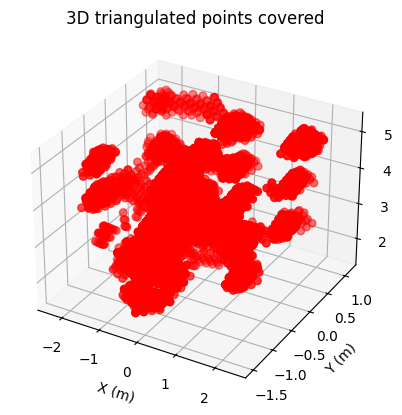

In [32]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

points_array = np.vstack(points_array)
points_array_m = points_array / 1000

np.savez('Points3D.npz', points_array_m)

ax.scatter(points_array_m[:, 0], points_array_m[:, 1], points_array_m[:, 2],
           c='red', marker='o', s=30)

ax.set_xlabel('X (m)')
ax.set_ylabel('Y (m)')
ax.set_zlabel('Z (m)')
ax.set_title('3D triangulated points covered')
plt.show()

In [33]:
ext_8h = np.load('calib_0428_13h30/Extrinsics_optimized_20250428_13h30.npz')['arr_0']
ext_11h = np.load('Extrinsics_optimized.npz')['arr_0']

diff = ext_8h - ext_11h
print(diff)

for mat in diff:
    print(np.linalg.norm(mat[0:3, 3]))

[[[    0.002     -0.0001     0.0004     0.9702]
  [    0.0052    -0.0044    -0.0003    -5.2767]
  [    0.0041     0.0051     0.0023     1.2104]]

 [[    0.0029     0.0011     0.0002    -3.9739]
  [    0.0038     0.013      0.0034    -0.7113]
  [   -0.0133     0.0038     0.0016    -2.0357]]

 [[    0.0156     0.0395     0.0102   473.1782]
  [   -0.0028     0.0531    -0.0037   607.1377]
  [   -0.0513     0.0078    -0.038   -522.4508]]

 [[    0.0022     0.0012     0.0004     2.5223]
  [    0.0034    -0.011     -0.0031     7.212 ]
  [   -0.0112    -0.003     -0.0011     0.2161]]

 [[   -0.005      0.0037     0.0008     3.7648]
  [    0.0088     0.0082     0.0042   -11.8553]
  [    0.0077    -0.0078    -0.0021     3.4039]]

 [[   -1.1853     0.3104    -0.7923  4212.5066]
  [   -0.7775    -0.9451     0.8036 -4233.7785]
  [    0.1443     0.012      0.0391  -226.9715]]

 [[    0.1603     0.0829    -0.0387  -754.6172]
  [   -0.5447     0.1451    -0.0067   625.2572]
  [   -0.1112    -0.526     